In [1]:
import os

import numpy as np
import pandas as pd
import math

# import seaborn
import seaborn as sns

# import plotly and offline mode
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
import plotly.figure_factory as ff

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

# # for 3D plotting
# import ipyvolume as ipv
# import ipywidgets as widgets

from trackml.dataset import load_event, load_dataset
from trackml.randomize import shuffle_hits
from trackml.score import score_event

from trackml.dataset import load_event, load_dataset
from trackml.randomize import shuffle_hits
from trackml.score import score_event

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
%matplotlib inline

import sys
sys.path.append("/Users/rinaonda/Downloads/ML/trackmlmeg/lib/")

In [2]:
path_to_train = "/Users/rinaonda/Downloads/ML/datafile/train_100_events"
event_prefix = "event000001000"
hits, cells, particles, truth = load_event(os.path.join(path_to_train, event_prefix))


In [6]:
assembly.head()


,hit_id,x,y,z,volume_id,layer_id,module_id,hit_edep,particle_id,tx,...,tpz,weight,vx,vy,vz,px,py,pz,q,nhits
0,1,-64.409897,-7.163700,-1502.5,7,2,1,0.000000,0,-64.411598,...,-956385.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0,0
1,2,-55.336102,0.635342,-1502.5,7,2,1,0.305441,22525763437723648,-55.338501,...,-15.49220,0.000010,-0.015802,0.006381,1.16279,-0.569670,-0.011187,-15.49600,1,10
2,3,-83.830498,-1.143010,-1502.5,7,2,1,0.334087,0,-83.828003,...,-760877.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0,0
3,4,-96.109100,-8.241030,-1502.5,7,2,1,0.403501,297237712845406208,-96.122902,...,-3.70232,0.000008,-0.000486,-0.015051,5.75865,-0.240629,0.012071,-3.70766,-1,11
4,5,-62.673599,-9.371200,-1502.5,7,2,1,0.323907,418835796137607168,-62.659401,...,-6.57318,0.000009,0.018366,-0.016865,4.19268,-0.268943,-0.058487,-6.58619,1,10


0 ,  1206
1 ,  1449
2 ,  550
3 ,  6087


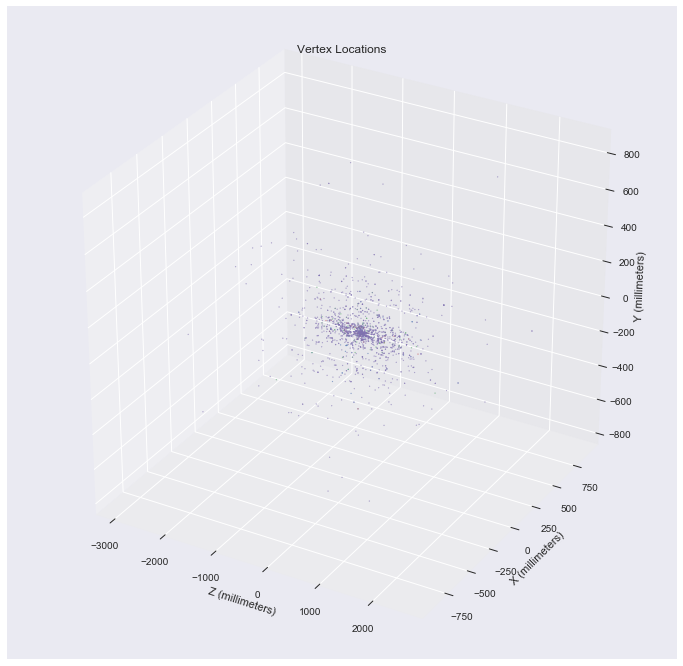

In [48]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

pars = truth.particle_id.unique()

n = 5
thresholds = [1, 1.5e-4, 1e-4, 0.9e-4, 0.8e-4]
for i in range(n-1):
    vtx = []
    vty = []
    vtz = []
    weight = []

    for pid in pars:
        if pid == 0:
            continue
        v = truth[truth.particle_id == pid]
        #print (v.vx.values)
        weights = np.sum(v.weight.values)
        #print('particle ', pid ,' : weight = ' , weights)
        if (weights < thresholds[i] and weights > thresholds[i+1]):
            #print('particle ' , pid , ' : weight = ' , weights)
            weight.append(weights)
            vtx.append(v.vx.values[0])
            vty.append(v.vy.values[0])
            vtz.append(v.vz.values[0])
    
    ax.scatter(vtz, vtx, vty, s=1, label='weight {}'.format(i), alpha=0.5)
    #ax.scatter(v.z, v.x, v.y, s=1, label='volume {}'.format(volume), alpha=0.5)
    print(i, ', ', len(vtz))
    
ax.set_title('Vertex Locations')
ax.set_xlabel('Z (millimeters)')
ax.set_ylabel('X (millimeters)')
ax.set_zlabel('Y (millimeters)')
plt.show()

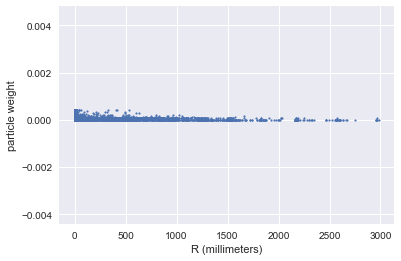

In [27]:

#fig1 = plt.figure(figsize=(12, 12))
#ax1 = fig1.add_subplot(111, projection='2d')

#fig2 = plt.figure(figsize=(12, 12))
#ax2 = fig2.add_subplot(111, projection='2d')

pars = truth.particle_id.unique()
vtr1 = []
vtr2 = []
weights = []

for pid in pars:
    if pid == 0:
        continue
    v = truth[truth.particle_id == pid]
    #print (v.vx.values)
    vtr1.append(math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2))
    vtr2.append(math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2 + v.vz.values[0]**2))
    w = np.sum(v.weight.values)
    weights.append(w)

plt.scatter(vtr1, weights, s=1, alpha=1)
    
#plt.('Vertex Locations')
plt.xlabel('R (millimeters)')
plt.ylabel('particle weight')


#plt.scatter(vtr2, weights, s=1, label='particle {}'.format(pid), alpha=0.5)    
#plt.set_title('Vertex Locations')
#plt.set_xlabel('R (millimeters)')
#plt.set_ylabel('particle weight')

plt.show()

In [16]:
pars = truth.particle_id.unique()
vtr1 = []
vtr2 = []
weights = []

for pid in pars:
    if pid == 0:
        continue
    v = particles[particles.particle_id == pid]
    #print (v.vx.values)
    R1 = math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2)
    R2 = math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2 + v.vz.values[0]**2)
    vtr1.append(R1)
    vtr2.append(R2)
    w = np.sum(truth[truth.particle_id == pid].weight.values)
    weights.append(w)
    



df = pd.DataFrame({'R1': vtr1,
                   'R2': vtr2,
                   'weight': weights})

df.iplot(kind='histogram', subplots=True, shape=(3, 1), filename='cufflinks/histogram-subplots')

In [17]:
#pars = truth.particle_id.unique()
vtr1_res = []
vtr2_res = []
weights_res = []

for pid in pars:
    if pid == 0:
        continue
    v = particles[particles.particle_id == pid]
    #print (v.vx.values)
    R1 = math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2)
    R2 = math.sqrt(v.vx.values[0]**2 + v.vy.values[0]**2 + v.vz.values[0]**2)
    if R1 < 0.05:
        vtr1_res.append(R1)
    if R2 < 20:
        vtr2_res.append(R2)
    w = np.sum(truth[truth.particle_id == pid].weight.values)
    if w > 50e-6:
        weights_res.append(w)
    
frac = len(vtr1_res)/len(vtr1)
print("vtx R < 0.05 : ", frac)

df1 = pd.DataFrame({'R1': vtr1_res})
df2 = pd.DataFrame({'R2': vtr2_res})
df3 = pd.DataFrame({'weight': weights_res})

df1.iplot(kind='histogram', subplots=True, shape=(1,1), filename='cufflinks/histogram-subplots')
df2.iplot(kind='histogram', subplots=True, shape=(1,1), filename='cufflinks/histogram-subplots')
df3.iplot(kind='histogram', subplots=True, shape=(1,1), filename='cufflinks/histogram-subplots')




vtx R < 0.05 :  0.7370563180312352


In [3]:
import math
def SpiralFitting(x,y,z):
    """最小二乗法に
    よる円フィッティングをする関数
        input: x,y 円フィッティングする点群

        output  cxe 中心x座標
                cye 中心y座標
                re  半径
    """

    sumx  = sum(x)
    sumy  = sum(y)
    sumx2 = sum([ix ** 2 for ix in x])
    sumy2 = sum([iy ** 2 for iy in y])
    sumxy = sum([ix * iy for (ix,iy) in zip(x,y)])

    F = np.array([[sumx2,sumxy,sumx],
                  [sumxy,sumy2,sumy],
                  [sumx,sumy,len(x)]])

    G = np.array([[-sum([ix ** 3 + ix*iy **2 for (ix,iy) in zip(x,y)])],
                  [-sum([ix ** 2 *iy + iy **3 for (ix,iy) in zip(x,y)])],
                  [-sum([ix ** 2 + iy **2 for (ix,iy) in zip(x,y)])]])

    T=np.linalg.inv(F).dot(G)

    cxe=float(T[0]/-2)
    cye=float(T[1]/-2)
    re=math.sqrt(cxe**2+cye**2-T[2])
    #print (cxe,cye,re)
    
    return (cxe,cye,re)

In [4]:
import converter as conv
converter_obj = conv.Converter(hits,cells,particles,truth)
converter_obj.convert_truth2hits()

nsamples = 10000
particles_sample = particles.sample(nsamples)
particle_id = particles_sample.particle_id.values

par0 = [-10000 for i in range(len(particle_id))]
par1 = [-10000 for i in range(len(particle_id))]
par2 = [-10000 for i in range(len(particle_id))]

raw_x = []
raw_y = []
raw_z = []
pars = [0,0,0]

first = True

for i in range(len(particle_id)):
    hit_id = converter_obj.hits.hit_id[converter_obj.hits.particle_id == particle_id[i]]
    x = converter_obj.hits.x[converter_obj.hits.particle_id == particle_id[i]]
    y = converter_obj.hits.y[converter_obj.hits.particle_id == particle_id[i]]
    z = converter_obj.hits.z[converter_obj.hits.particle_id == particle_id[i]]
    #print(x.values)
    if len(x) > 3:
        (cxe,cye,re) = SpiralFitting(x.values,y.values,z.values)
        par0[i] = cxe
        par1[i] = cye
        par2[i] = re
        if first :
            raw_x = x
            raw_y = y
            raw_z = z
            pars[0] = cxe
            pars[1] = cye
            pars[2] = re
            first = False
    else:
        par0[i] = -5000
        par1[i] = -5000
        par2[i] = -5000
    

In [5]:
df = pd.DataFrame({'x0': par0,
                   'y0': par1,
                   'R': par2})

df.iplot(kind='histogram', subplots=True, shape=(3, 1), filename='cufflinks/histogram-subplots')


In [4]:
import tracking_utility as trut

par3 = []
par4 = []
par5 = []

nsamples = 10000
particles_samples = particles.sample(nsamples)
for i in range(nsamples):
    truth_samples = truth[truth.particle_id == particles_samples.particle_id.values[i]]
    if len(truth_samples) > 2:
        x = np.array([truth_samples.tx.values[0], truth_samples.tx.values[1],truth_samples.tx.values[2]])
        y = np.array([truth_samples.ty.values[0], truth_samples.ty.values[1],truth_samples.ty.values[2]])
        u, D, phi = trut.get_uDp(x,y)
        par3.append(u)
        par4.append(D)
        par5.append(phi)
    
df = pd.DataFrame({'u': par3,
                   'D': par4,
                   'theta': par5})

df.iplot(kind='histogram', subplots=True, shape=(3, 1), filename='cufflinks/histogram-subplots')



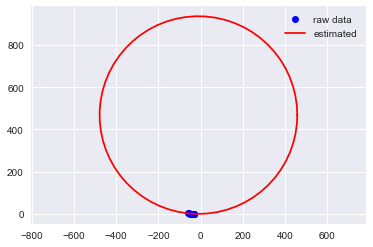

In [8]:
#円描画
theta=np.arange(0,2*math.pi,0.1)
xe=[]
ye=[]
for itheta in theta:
    xe.append(pars[2]*math.cos(itheta)+pars[0])
    ye.append(pars[2]*math.sin(itheta)+pars[1])
xe.append(xe[0])
ye.append(ye[0])

plt.plot(raw_x,raw_y,"ob",label="raw data")
plt.plot(xe,ye,"-r",label="estimated")
#plt.plot(cx,cy,"xb",label="center")
plt.axis("equal")
plt.grid(True)
plt.legend()
plt.show()

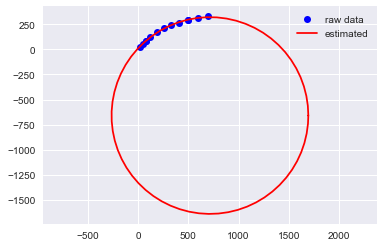

In [19]:
#円描画
theta=np.arange(0,2*math.pi,0.1)
xe=[]
ye=[]
for itheta in theta:
    xe.append(re*math.cos(itheta)+cxe)
    ye.append(re*math.sin(itheta)+cye)
xe.append(xe[0])
ye.append(ye[0])

plt.plot(x,y,"ob",label="raw data")
plt.plot(xe,ye,"-r",label="estimated")
#plt.plot(cx,cy,"xb",label="center")
plt.axis("equal")
plt.grid(True)
plt.legend()
plt.show()

particle  662031206824546305  p =  0.144614  nhits =  0
[]
particle  860190071448403968  p =  0.377415  nhits =  13
[ 20283  20440  29036  36208  42692  74147  81208  81213  87476  93322
  93325 109426 114153]
particle  788132408707780609  p =  0.474865  nhits =  0
[]
particle  391814541987549185  p =  0.11309  nhits =  0
[]
particle  63053143562256384  p =  0.503864  nhits =  9
[18265 27088 27119 33832 39945 69592 71150 71763 78335]
particle  63064894592778240  p =  0.310638  nhits =  12
[ 22081  29950  36870  43229  43234  75254  82155  88690  94970 110861
 118322 118335]
particle  571960176333029376  p =  2.58512  nhits =  2
[18139 26279]
particle  779124522241490944  p =  3.24641  nhits =  10
[ 24432  32386  39617  77964  78146  98468  99844 101145 102358 120915]
particle  220683666005688320  p =  0.252224  nhits =  8
[ 22601  30216  37085  43978  75917  82691  89520 120340]
particle  788134057958440960  p =  0.374468  nhits =  14
[ 21444  29617  29637  36645  37404  43666  75620  

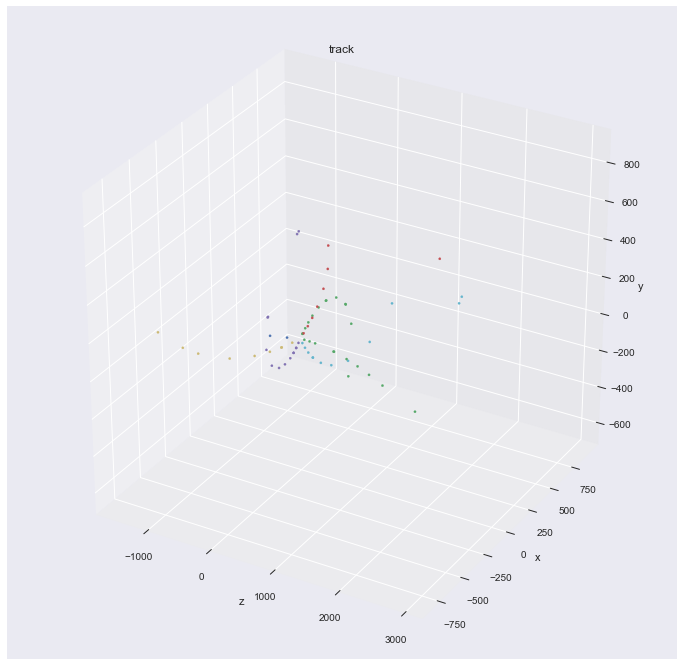

In [12]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

particles_sample = particles.sample(10)
particle_id = particles_sample.particle_id.values

for i in range(len(particle_id)):
    hit_id = hits.hit_id[hits.particle_id == particle_id[i]]
    x = hits.x[hits.particle_id == particle_id[i]]
    y = hits.y[hits.particle_id == particle_id[i]]
    z = hits.z[hits.particle_id == particle_id[i]]
        
    ax.scatter(z, x, y, s=5, label='particle {}'.format(particle_id[i]), alpha=1)
    
    print('particle ', particle_id[i], ' p = ', particles_sample.p.values[i], ' nhits = ', particles_sample.nhits.values[i])
    print(hit_id.values)
    
    
ax.set_title('track')
ax.set_xlabel('z')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN

class Clusterer(object):
    
    def __init__(self, eps):
        self.eps = eps
        
    
    def _preprocess(self, hits):
        
        x = hits.x.values
        y = hits.y.values
        z = hits.z.values

        r = np.sqrt(x**2 + y**2 + z**2)
        hits['x2'] = x/r
        hits['y2'] = y/r

        r = np.sqrt(x**2 + y**2)
        hits['z2'] = z/r

        ss = StandardScaler()
        X = ss.fit_transform(hits[['x2', 'y2', 'z2']].values)
        
        return X
    
    
    def predict(self, hits):
        
        X = self._preprocess(hits)
        
        cl = DBSCAN(eps=self.eps, min_samples=1, algorithm='kd_tree')
        labels = cl.fit_predict(X)
        
        return labels

In [14]:
model = Clusterer(eps=0.008)
labels = model.predict(hits)

particle  707069058507341824  p =  12.7253  nhits =  12
[ 1327  3065  5218  7727 10585 10626 13553 13619 13674 16564 16636 16679]
particle  698059385351438336  p =  0.498509  nhits =  14
[ 23077  23190  31292  38429  44985  76440  76443  83872  90492  96881
  96882 118462 118940 118945]
particle  220710672776826881  p =  0.351312  nhits =  11
[ 26677  34274  34279  41027  73072  80206  87036  92921 109090 109093
 114087]
particle  153126716657631232  p =  0.738841  nhits =  5
[20364 20474 29051 35484 41601]
particle  873702794492645377  p =  1.06138  nhits =  12
[ 11820  11840  14494  14557  14625  68661  68693  70190  71384  78401
 106299 106307]
particle  630504360148729856  p =  4.84297  nhits =  12
[ 928  979 2605 2630 4608 4676 6962 7004 7078 9717 9794 9899]
particle  103587326914985984  p =  17.5112  nhits =  16
[46954 47045 47141 49984 50094 50168 53060 53132 55904 55988 58323 58397
 60389 60446 62149 62190]
particle  301757873866670080  p =  0.399464  nhits =  11
[ 28306  35060

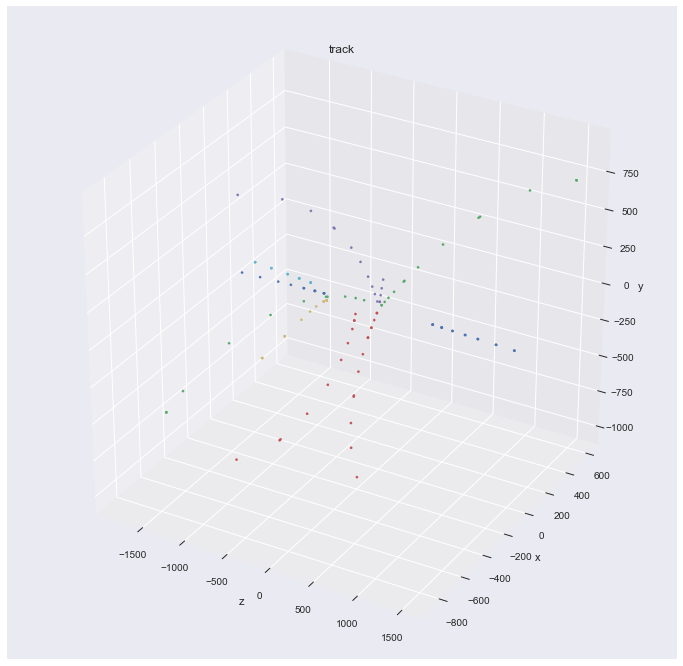

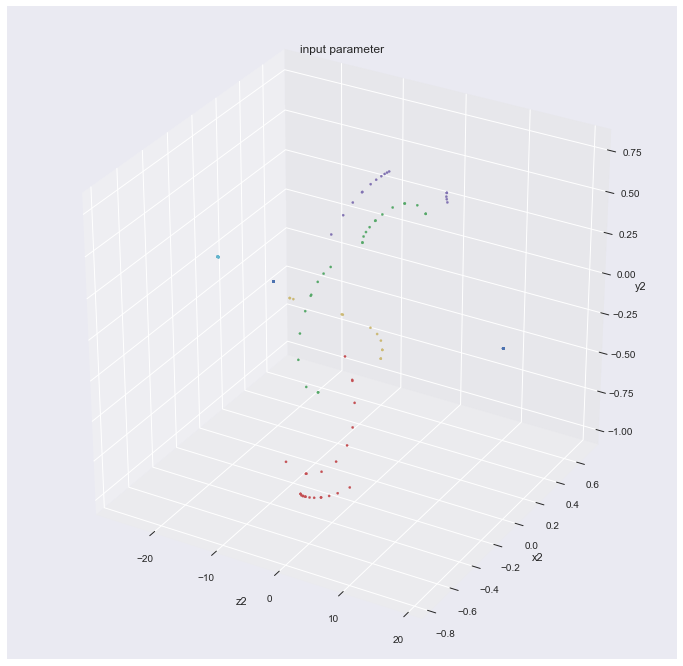

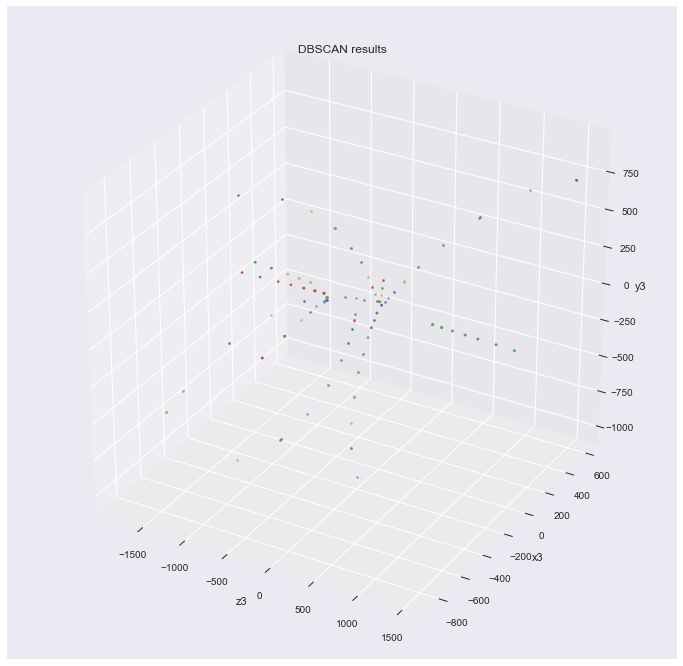

In [34]:


fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

fig2 = plt.figure(figsize=(12, 12))
ax2 = fig2.add_subplot(111, projection='3d')

fig3 = plt.figure(figsize=(12, 12))
ax3 = fig3.add_subplot(111, projection='3d')

particles_sample = particles.sample(10)
particle_id = particles_sample.particle_id.values


for i in range(len(particle_id)):
    hit_id = hits.hit_id[hits.particle_id == particle_id[i]]
    x = hits.x[hits.particle_id == particle_id[i]]
    y = hits.y[hits.particle_id == particle_id[i]]
    z = hits.z[hits.particle_id == particle_id[i]]
    
    r = np.sqrt(x**2 + y**2 + z**2)
    x2 = x/r
    y2 = y/r

    r = np.sqrt(x**2 + y**2)
    z2 = z/r
        
    ax.scatter(z, x, y, s=5, label='particle {}'.format(particle_id[i]), alpha=1)
    ax2.scatter(z2, x2, y2, s=5, label='particle {}'.format(particle_id[i]), alpha=1)
    
    print('particle ', particle_id[i], ' p = ', particles_sample.p.values[i], ' nhits = ', particles_sample.nhits.values[i])
    print(hit_id.values)


nclusters = max(labels)
print(nclusters)
for i in range(nclusters):
#for i in range(1000):
    #boolian_list = (labels == i)
    #print(boolian_list)
    icluster = np.where(labels==i);
    #print(icluster)
    #print(len(icluster[0]))
    #if len(icluster[0]) < 10:
    #    continue
    x3 = []
    y3 = []
    z3 = []
    for j in range(len(icluster[0])):
        pid = hits.particle_id[hits.hit_id == icluster[0][j] + 1]
        #print(pid.values)
        
        hid = []
        for k in range(len(particle_id)):
            if particle_id[k] == pid.values[0] :
                hid.append(icluster[0][j] + 1)
        
        for k in range(len(hid)):
            #print(hid[k])
            index = np.where(hits.hit_id == hid[k])
            x_v = hits.x[index[0]]
            y_v = hits.y[index[0]]
            z_v = hits.z[index[0]]
            
            #print(x_v.values[0])
            x3.append(x_v.values[0])
            y3.append(y_v.values[0])
            z3.append(z_v.values[0])
                
    
    if len(x3) == 0:
        continue
    
    ax3.scatter(z3, x3, y3, s=5, alpha=1)
    #ax.scatter(z3, x3, y3, s=5, label='cluster {}'.format(labels), alpha=1)
    
ax.set_title('track')
ax.set_xlabel('z')
ax.set_ylabel('x')
ax.set_zlabel('y')
#plt.show()
ax2.set_title('input parameter')
ax2.set_xlabel('z2')
ax2.set_ylabel('x2')
ax2.set_zlabel('y2')
ax3.set_title('DBSCAN results')
ax3.set_xlabel('z3')
ax3.set_ylabel('x3')
ax3.set_zlabel('y3')
plt.show()

In [93]:
path_to_test = "/Users/rinaonda/Downloads/ML/datafile/test"
test_dataset_submissions = []

create_submission = True # True for submission 

if create_submission:
    for event_id, hits, cells in load_dataset(path_to_test, parts=['hits', 'cells']):

        # Track pattern recognition
        model = Clusterer(eps=0.008)
        labels = model.predict(hits, cells)

        # Prepare submission for an event
        one_submission = create_one_event_submission(event_id, hits, labels)
        test_dataset_submissions.append(one_submission)
        
        print('Event ID: ', event_id)

    # Create submission file
    submussion = pd.concat(test_dataset_submissions, axis=0)
    submussion.to_csv('/Users/rinaonda/Downloads/ML/output/DBScan_submission3.csv.gz', index=False, compression='gzip')

Event ID:  0
Event ID:  1
Event ID:  2
Event ID:  3
Event ID:  4
Event ID:  5
Event ID:  6
Event ID:  7
Event ID:  8
Event ID:  9
Event ID:  10
Event ID:  11
Event ID:  12
Event ID:  13
Event ID:  14
Event ID:  15
Event ID:  16
Event ID:  17
Event ID:  18
Event ID:  19
Event ID:  20
Event ID:  21
Event ID:  22
Event ID:  23
Event ID:  24
Event ID:  25
Event ID:  26
Event ID:  27
Event ID:  28
Event ID:  29
Event ID:  30
Event ID:  31
Event ID:  32
Event ID:  33
Event ID:  34
Event ID:  35
Event ID:  36
Event ID:  37
Event ID:  38
Event ID:  39
Event ID:  40
Event ID:  41
Event ID:  42
Event ID:  43
Event ID:  44
Event ID:  45
Event ID:  46
Event ID:  47
Event ID:  48
Event ID:  49
Event ID:  50
Event ID:  51
Event ID:  52
Event ID:  53
Event ID:  54
Event ID:  55
Event ID:  56
Event ID:  57
Event ID:  58
Event ID:  59
Event ID:  60
Event ID:  61
Event ID:  62
Event ID:  63
Event ID:  64
Event ID:  65
Event ID:  66
Event ID:  67
Event ID:  68
Event ID:  69
Event ID:  70
Event ID:  71
Ev